In [1]:
%matplotlib inline
%load_ext memory_profiler

import os, sys, glob, re, math, pickle
import phate,scprep,magic,meld
import graphtools as gt
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import time,random,datetime
from sklearn import metrics
from sklearn import model_selection
from scipy import sparse
from scipy.stats import mannwhitneyu, tiecorrect, rankdata
from statsmodels.stats.multitest import multipletests
import scanpy as sc
import scvelo as scv
from adjustText import adjust_text
import warnings
from matplotlib import gridspec



# settings
plt.rc('font', size = 9)
plt.rc('font', family='sans serif')
plt.rcParams['pdf.fonttype']=42
plt.rcParams['ps.fonttype']=42
plt.rcParams['text.usetex']=False
plt.rcParams['legend.frameon']=False
plt.rcParams['axes.grid']=False
plt.rcParams['legend.markerscale']=0.5
sc.set_figure_params(dpi=300,dpi_save=600,
                     frameon=False,
                     fontsize=9)
plt.rcParams['savefig.dpi']=600
sc.settings.verbosity=2
sc._settings.ScanpyConfig.n_jobs=-1
sns.set_style("ticks")

In [2]:
# fps
dfp = '/home/cl2292/project/SCA1_snRNAseq/Mouse/data/'
pfp = '/home/cl2292/project/SCA1_snRNAseq/Mouse/results/'
sc.settings.figdir = pfp

In [3]:
# settings
plt.rc('font', size = 8)
plt.rc('font', family='sans serif')
plt.rcParams['pdf.fonttype']=42
plt.rcParams['ps.fonttype']=42
plt.rcParams['text.usetex']=False
plt.rcParams['legend.frameon']=False
plt.rcParams['axes.grid']=False
plt.rcParams['legend.markerscale']=0.5
sc.set_figure_params(dpi=300,dpi_save=600,
                     frameon=False,
                     fontsize=8)
plt.rcParams['savefig.dpi']=600
sc.settings.verbosity=2
sc._settings.ScanpyConfig.n_jobs=-1



In [4]:
# Load Data

if True :
    start = time.time()
    backed=None # None if not
    fname='211026_mouse_imp.h5ad' # for full, can maybe get away with ~300G
    %memit bdata = sc.read_h5ad(os.path.join(dfp,fname),backed=backed)
    print('loaded @'+datetime.datetime.now().strftime('%y%m%d.%H:%M:%S'))
    print('took {:.2f}-s to load data'.format(time.time()-start))

peak memory: 74590.71 MiB, increment: 74395.77 MiB
loaded @211208.11:03:32
took 71.88-s to load data


In [5]:
genes = ['Gabra6', 'Slc17a6', 'Eomes', 'Atp2a3', 'Gad2', 'Lgi2', 'Aldh1l1',
         'Gdf10', 'Pdgfra', 'Mog', 'Cx3cr1', 'Flt1', 'Lum']

In [5]:
genes2 = ['Nxph1', 'Ptprk', 'Nrg1','Pax2']

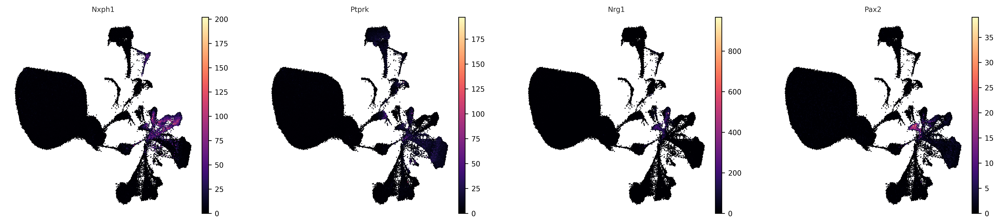

In [6]:
sc.pl.umap(bdata, color =genes2, size = 5, cmap = 'magma', save = '211101_umap_genes_before_magic_v3')

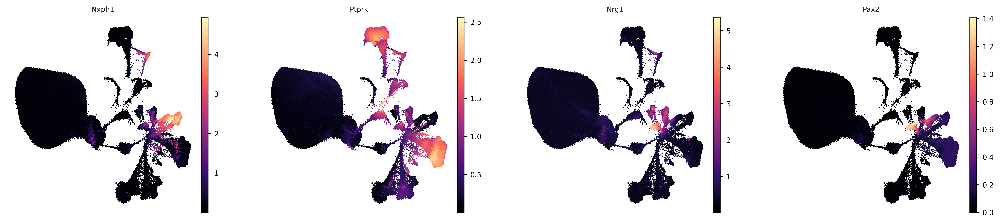

In [7]:
sc.pl.umap(bdata, color =genes2, size = 5, cmap = 'magma',  layer = 'imputed_bbknn', save = '211101_umap_genes_after_magic_v3')

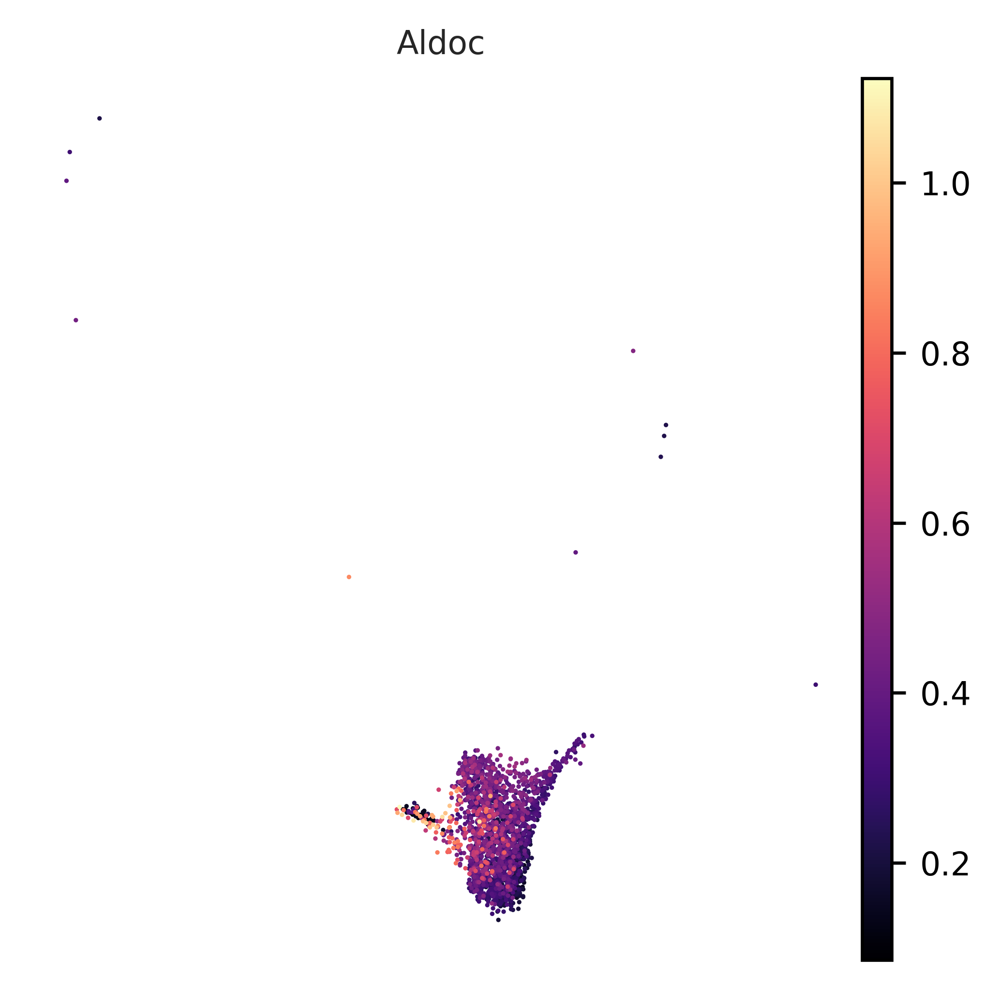

In [35]:
sc.pl.umap(cdata, color ='Aldoc', size = 5,
           cmap = 'magma',
           layer = 'imputed_bbknn',
           #save = '211026_umap_genes_before_magic'
          )

In [8]:
bdata.obs.groupby('sub2').mean()['total_counts']

sub2
Astrocyte                           5578.126953
Bergmann glia                       5803.935547
Endothelial cell                    5582.273926
Granule cell                        3533.712158
GABAergic interneuron 1            10762.512695
GABAergic interneuron 2             6390.188965
GABAergic interneuron 3            14661.022461
Oligodendrocyte                     5384.851562
Oligodendrocyte progenitor cell     5552.721191
Unipolar brush cell                12282.712891
Purkinje cell                      18558.074219
Pericyte                           10859.645508
Microglia                           3886.952393
ZPC                                26129.623047
Name: total_counts, dtype: float32

In [17]:
adata = bdata

In [21]:
##Original - use for UMAP

cmap_sub2={'Granule cell': '#FAC18A',
            'Unipolar brush cell': '#BA61BA',
            'Purkinje cell': '#EE5264',
            'ZPC': '#82c0e7',
            'GABAergic interneuron 1': '#F9EBAE',
            'GABAergic interneuron 2': '#88BB92',
            'GABAergic interneuron 3': '#46A928',
            'Astrocyte': '#F9AEAE',
            'Bergmann glia': '#AEB7F9',
            'Oligodendrocyte progenitor cell': '#F1815F',
            'Oligodendrocyte': '#75A3B7',
            'Microglia': '#AC5861',
            'Pericyte': '#2D284B',
            'Endothelial cell': '#1C67EE'}

adata.uns['sub2_colors']=np.array(list(cmap_sub2.values()),dtype=object)
adata.obs['sub2'].cat.reorder_categories(new_categories=list(cmap_sub2.keys()),
                                         inplace=True,ordered=True)

In [24]:
order_mouse=[
    'Granule cell',
    'Unipolar brush cell',
    'Purkinje cell',
    'ZPC',
    'GABAergic interneuron 1',
    'GABAergic interneuron 2',
    'GABAergic interneuron 3',
    'Astrocyte',
    'Bergmann glia',
    'Oligodendrocyte progenitor cell',
    'Oligodendrocyte',
    'Microglia',
    'Pericyte',
    'Endothelial cell'
]

In [4]:
# Load Data

if True :
    start = time.time()
    backed=None # None if not
    fname='211027_mouse.h5ad' # for full, can maybe get away with ~300G
    %memit adata = sc.read_h5ad(os.path.join(dfp,fname),backed=backed)
    print('loaded @'+datetime.datetime.now().strftime('%y%m%d.%H:%M:%S'))
    print('took {:.2f}-s to load data'.format(time.time()-start))

peak memory: 10773.05 MiB, increment: 10577.92 MiB
loaded @211027.14:32:49
took 17.24-s to load data


In [5]:
adata.obs['sub4'] = pd.Series(['GC', 'DCN', 'UBC', 'PC', 'MLI1', 'MLI2', 'GoC', 'AS', 'BG', 'OPC', 'OL', 'MG', 'PER', 'END'], dtype = "category")
adata.obs['sub4'].cat.set_categories(['GC', 'DCN', 'UBC','PC', 'MLI1', 'MLI2', 'GoC', 'AS', 'BG', 'OPC', 'OL', 'MG', 'PER', 'END'], ordered=True, inplace=True)

In [6]:
#assign
obs = 'sub3'

gc = ((adata.obs[obs]=="GC"))
dcn = ((adata.obs[obs]=="DCN"))
ubc = ((adata.obs[obs]=="UBC"))
pc = ((adata.obs[obs]=="Z+PC")|(adata.obs[obs]=="Z-PC"))
mli1 = (adata.obs[obs]=="MLI1")
mli2 = (adata.obs[obs]=="MLI2")
goc = (adata.obs[obs]=="GoC")
ast = ((adata.obs[obs]=="AS"))
bg = ((adata.obs[obs]=="BG"))
ol = ((adata.obs[obs]=="OL"))
opc = ((adata.obs[obs]=="OPC"))
mg = ((adata.obs[obs]=="MG"))
end =  ((adata.obs[obs]=="END"))
per = ((adata.obs[obs]=="PER"))





new_obs = 'sub4'
adata.obs[new_obs].loc[gc] = "GC"
adata.obs[new_obs].loc[dcn] = "DCN"
adata.obs[new_obs].loc[ubc] = "UBC"
adata.obs[new_obs].loc[pc] = "PC"
adata.obs[new_obs].loc[mli1] = "MLI1"
adata.obs[new_obs].loc[mli2] = "MLI2"
adata.obs[new_obs].loc[goc] = "GoC"
adata.obs[new_obs].loc[ast] = "AS"
adata.obs[new_obs].loc[bg] = "BG"
adata.obs[new_obs].loc[ol] = "OL"
adata.obs[new_obs].loc[opc] = "OPC"
adata.obs[new_obs].loc[mg] = "MG"
adata.obs[new_obs].loc[end] = "END"
adata.obs[new_obs].loc[per] = "PER"

In [7]:
##Original - use for UMAP

cmap_sub4={'GC': '#FAC18A',
            'DCN': '#AAABAB',
            'UBC': '#BA61BA',
            'PC': '#EE5264',
            'MLI1': '#F9EBAE',
            'MLI2': '#88BB92',
            'GoC': '#46A928',
            'AS': '#F9AEAE',
            'BG': '#AEB7F9',
            'OPC': '#F1815F',
            'OL': '#75A3B7',
            'MG': '#AC5861',
            'PER': '#2D284B',
            'END': '#1C67EE'}

adata.uns['sub4_colors']=np.array(list(cmap_sub4.values()),dtype=object)
adata.obs['sub4'].cat.reorder_categories(new_categories=list(cmap_sub4.keys()),
                                         inplace=True,ordered=True)

In [8]:
order_mouse=[
    'GC',
    'DCN',
    'UBC',
    'PC',
    'MLI1',
    'MLI2',
    'GoC',
    'AS',
    'BG',
    'OPC',
    'OL',
    'MG',
    'PER',
    'END'
]

In [7]:
##Original - use for UMAP

cmap_sub3={'GC': '#FAC18A',
            'DCN': '#AAABAB',
            'UBC': '#BA61BA',
            'Z+PC': '#82c0e7',
            'Z-PC': '#EE5264',
            'MLI1': '#F9EBAE',
            'MLI2': '#88BB92',
            'GoC': '#46A928',
            'AS': '#F9AEAE',
            'BG': '#AEB7F9',
            'OPC': '#F1815F',
            'OL': '#75A3B7',
            'MG': '#AC5861',
            'PER': '#2D284B',
            'END': '#1C67EE'}

adata.uns['sub3_colors']=np.array(list(cmap_sub3.values()),dtype=object)
adata.obs['sub3'].cat.reorder_categories(new_categories=list(cmap_sub3.keys()),
                                         inplace=True,ordered=True)

In [8]:
order_mouse=[
    'GC',
    'DCN',
    'UBC',
    'Z+PC',
    'Z-PC',
    'MLI1',
    'MLI2',
    'GoC',
    'AS',
    'BG',
    'OPC',
    'OL',
    'MG',
    'PER',
    'END'
]

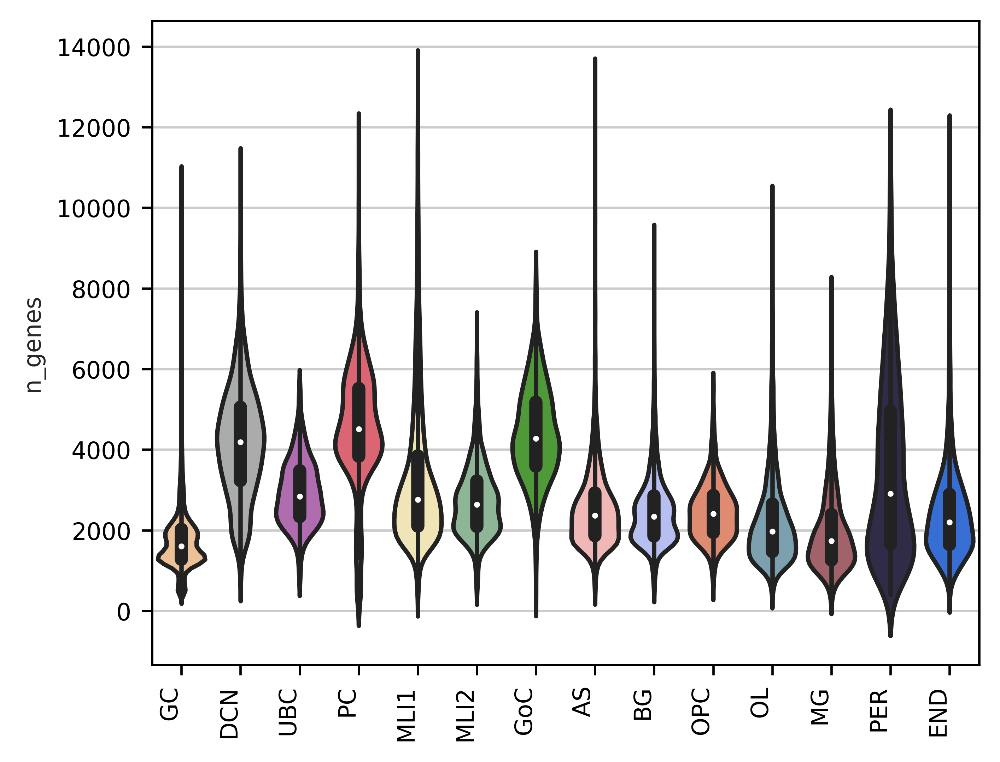

In [9]:
fig, ax = plt.subplots(1,1, figsize=(5,4))
sns.violinplot(x='sub4', y='n_genes', data=adata.obs, dodge=False, ax=ax, hue='sub4', palette=cmap_sub4,
              order=order_mouse)
# ax.set_yscale('log')
ax.legend().set_visible(False)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')
ax.set_xlabel('')
fig.savefig(os.path.join(pfp, 'n_genes_mouse_by_ctype.pdf'))

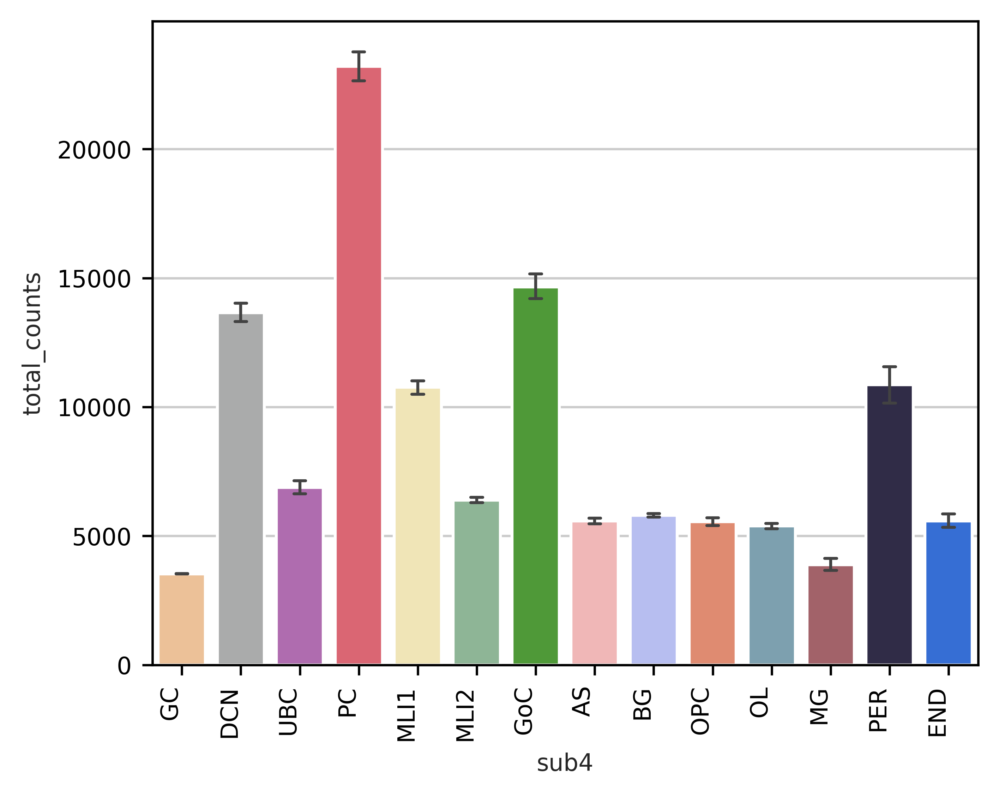

In [10]:
fig, ax = plt.subplots(1,1, figsize=(5,4))

sns.barplot(x='sub4', 
               y='total_counts', 
               data=adata.obs, 
               dodge=False, 
               ax=ax, 
               hue='sub4', 
               palette=cmap_sub4,
               capsize=.2,
#               linewdith=0.1,
               errwidth=1,
               order=order_mouse)

# ax.set_ylim([0, 50000])
# ax.set_yscale('log')
ax.legend().set_visible(False)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

fig.savefig(os.path.join(pfp, 'umi_count_mouse_by_ctype.pdf'))

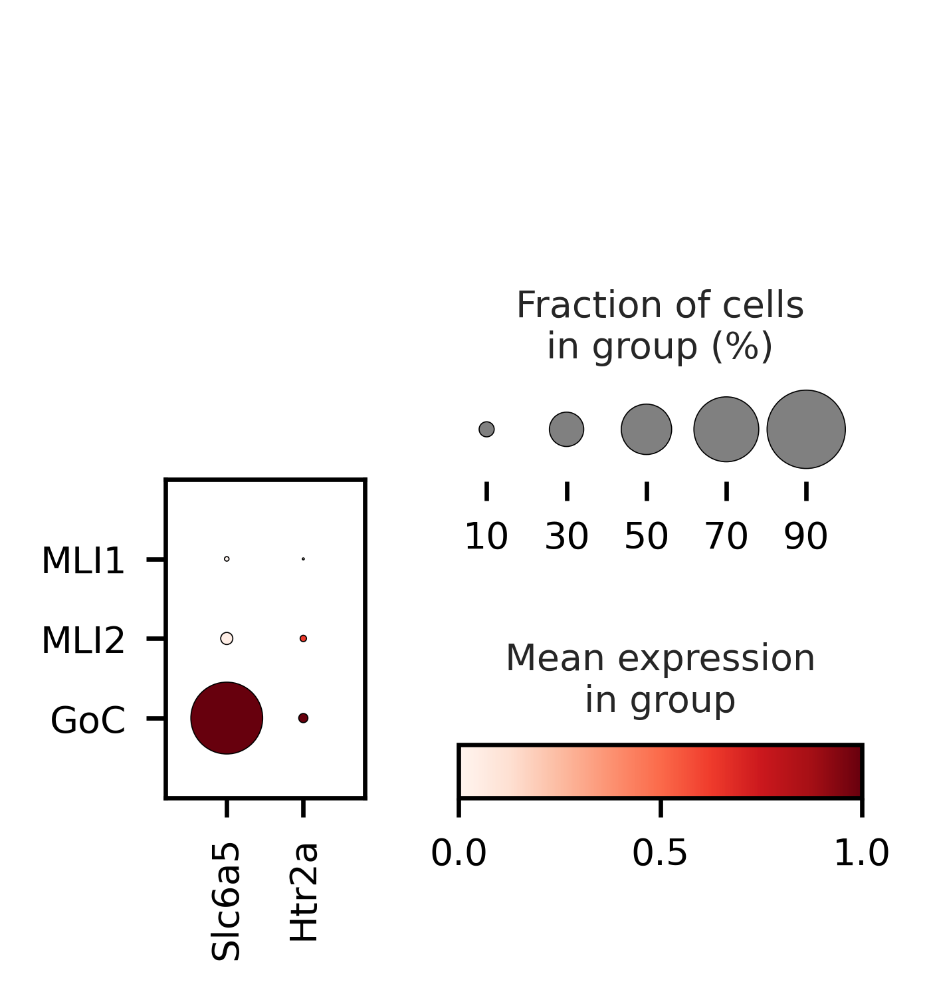

In [13]:
bdata = adata[(adata.obs['sub3'] == 'MLI1')|(adata.obs['sub3'] == 'MLI2')|(adata.obs['sub3'] == 'GoC'), :]
sc.pl.dotplot(bdata, ['Slc6a5', 'Htr2a'], groupby='sub3', standard_scale='var')

In [48]:
print(adata.obs['batch'].value_counts())
print("")
print(adata.obs['genotype'].value_counts())

15162    19350
13       13116
1516      9885
11        8405
132       7427
4092      6341
14        4508
122       3520
12        2764
409       2472
Name: batch, dtype: int64

Ctrl    42556
SCA1    35232
Name: genotype, dtype: int64


In [13]:
cdata = bdata[(bdata.obs['sub2'] == 'Purkinje cell')|(bdata.obs['sub2'] == 'ZPC'), :]

In [16]:
for i in cdata.obs['timepoint'].unique():  
    for j in cdata.obs['genotype'].unique():  
        print(i + j)
        print(cdata[(cdata.obs['timepoint'] == i)&(cdata.obs['genotype'] == j), :].obs['sub2'].value_counts())
        print('')

5wkWT
ZPC              154
Purkinje cell     62
Name: sub2, dtype: int64

5wkSCA1
Purkinje cell    104
ZPC               98
Name: sub2, dtype: int64

12wkWT
ZPC              90
Purkinje cell    22
Name: sub2, dtype: int64

12wkSCA1
ZPC              59
Purkinje cell    32
Name: sub2, dtype: int64

18wkWT
ZPC              361
Purkinje cell    100
Name: sub2, dtype: int64

18wkSCA1
Purkinje cell    263
ZPC              139
Name: sub2, dtype: int64

24wkWT
ZPC              83
Purkinje cell    62
Name: sub2, dtype: int64

24wkSCA1
ZPC              67
Purkinje cell    47
Name: sub2, dtype: int64

30wkWT
ZPC              152
Purkinje cell     66
Name: sub2, dtype: int64

30wkSCA1
ZPC              131
Purkinje cell     82
Name: sub2, dtype: int64



In [11]:
bdata.obs['batch'].value_counts()

65732    20775
6569     20332
65731    19214
6571     18333
65702    15911
65701    14397
58231    13851
58241    13353
58232    12367
1974     12196
7202     11690
58242    10958
5822     10670
20202    10013
72921     8989
2020      8818
72922     8676
5812      8572
2021      8349
2065      7879
22018     7676
20212     6886
72932     6810
72931     6680
2062      6599
7294      6239
1589      6216
22019     5986
2063      5242
2061      4635
Name: batch, dtype: int64

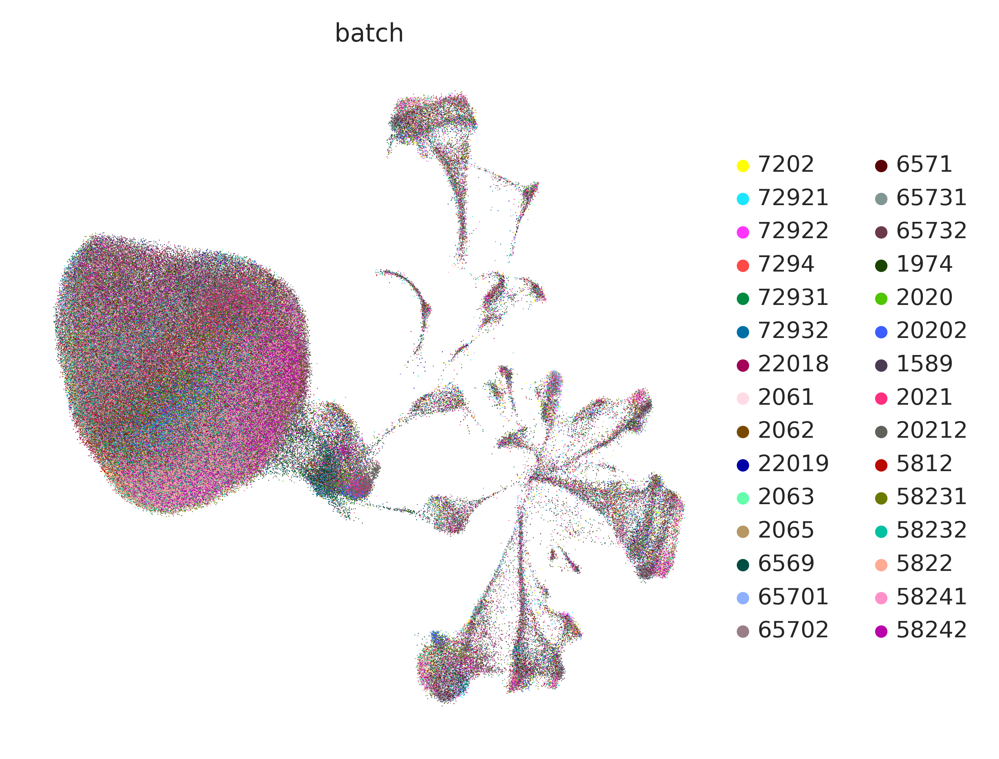

In [9]:
sc.pl.umap(bdata, color = 'batch',
           save = '211208_mouse_umap_batch.pdf'
          )

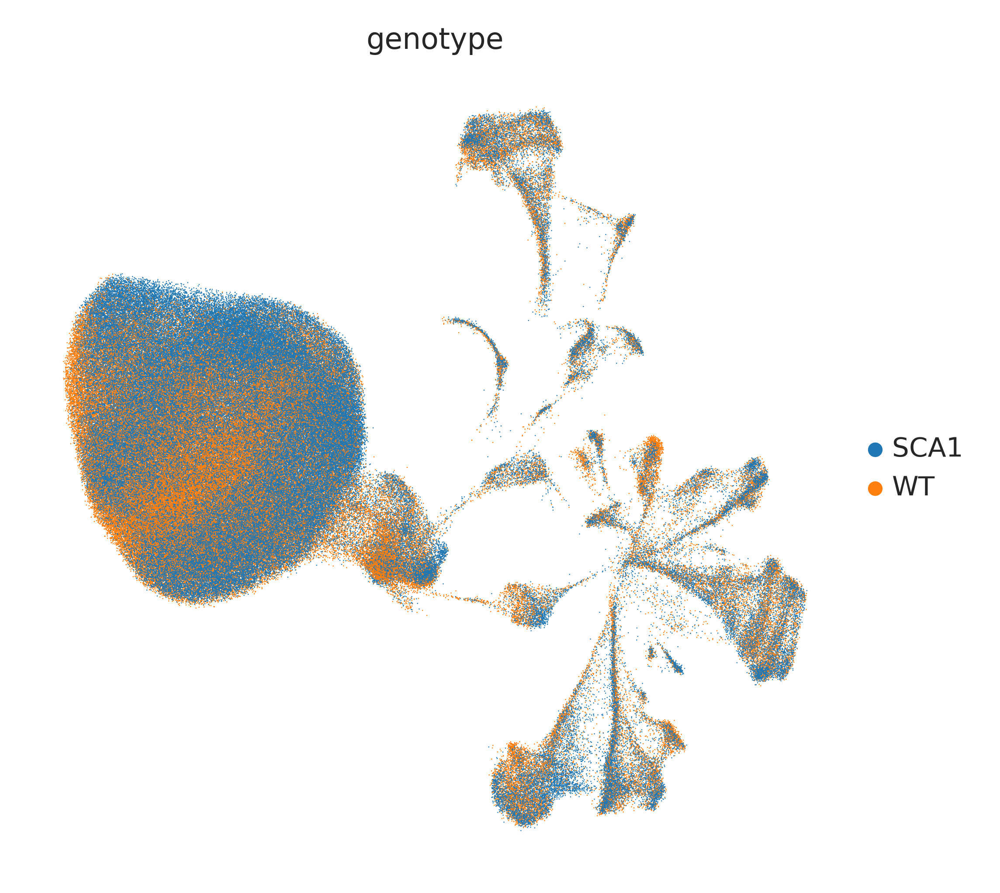

In [10]:
sc.pl.umap(bdata, color = 'genotype',
           save = '211208_mouse_umap_genotype.pdf'
          )

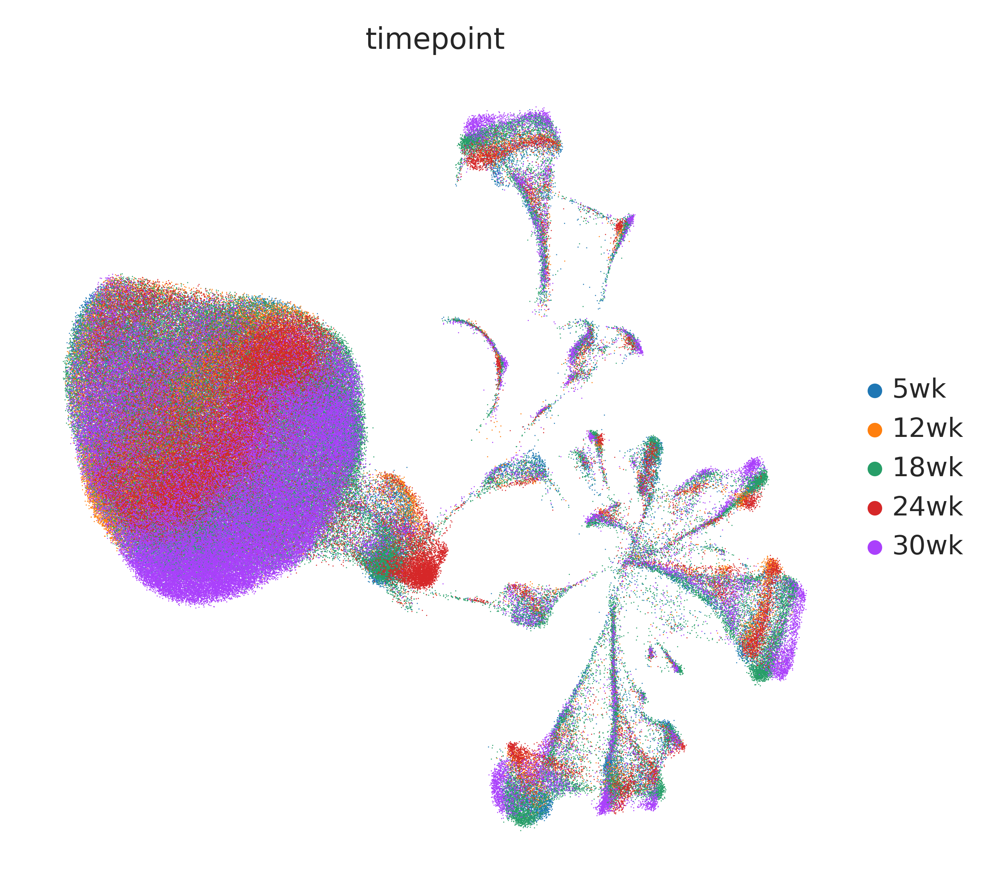

In [11]:
sc.pl.umap(bdata, color = 'timepoint',
           save = '211208_mouse_umap_timepoint.pdf'
          )